### Classes and modules

In [1]:
#Lets have matplotlib "inline"
%matplotlib inline

import os
import sys

#Import packages we need
import numpy as np
from netCDF4 import Dataset
import datetime
from IPython.display import display
import pyproj

#For plotting
import matplotlib
import matplotlib.pyplot as plt

plt.rcParams["lines.color"] = "w"
plt.rcParams["text.color"] = "w"
plt.rcParams["axes.labelcolor"] = "w"
plt.rcParams["xtick.color"] = "w"
plt.rcParams["ytick.color"] = "w"

from importlib import reload

In [2]:
from IPython.display import clear_output
from matplotlib import animation, rc
plt.rcParams["animation.html"] = "jshtml"
from mpl_toolkits.axes_grid1 import make_axes_locatable

from gpuocean.utils import PlotHelper
from gpuocean.utils.NetCDFInitialization import depth_integration

def plotSolution(fig, 
                 eta, hu, hv, h, dx, dy, 
                 t, comment,
                 h_min=-0.5, h_max=0.5, 
                 uv_min=-0.3, uv_max=0.3,
                 add_extra=False,
                 ax=None, sp=None):


    from datetime import timedelta
    fig.suptitle("Time = {:0>8} ({:s})".format(str(timedelta(seconds=int(t))), comment), 
                 fontsize=18,
                 horizontalalignment='left')
    
    ny, nx = eta.shape
    domain_extent = [0, nx*dx, 0, ny*dy]
    
    x_plots = 3
    y_plots = 1
    if (add_extra == True):
        x_plots=3
        y_plots=2
    
    V_max = 3 * (uv_max-uv_min) / np.max(h)
    R_min = -V_max/2000
    R_max = V_max/2000
   
    hu_label, hv_label = "$u$", "$v$"

    if (ax is None):
        ax = [None]*x_plots*y_plots
        sp = [None]*x_plots*y_plots
        
        ax[0] = plt.subplot(y_plots, x_plots, 1)
        sp[0] = ax[0].imshow(eta, interpolation="none", origin='lower', 
                             cmap=plt.cm.coolwarm, 
                             vmin=h_min, vmax=h_max, 
                             extent=domain_extent)
        plt.axis('image')
        plt.title("$\eta{}$")
        divider0 = make_axes_locatable(ax[0])
        cax0 = divider0.append_axes('right', size='5%', pad=0.05)
        fig.colorbar(sp[0],cax=cax0)


        ax[1] = plt.subplot(y_plots, x_plots, 2)
        sp[1] = ax[1].imshow(hu, interpolation="none", origin='lower', 
                            cmap=plt.cm.coolwarm, 
                            vmin=uv_min, vmax=uv_max, 
                            extent=domain_extent)
        plt.axis('image')
        plt.title(hu_label)
        divider1 = make_axes_locatable(ax[1])
        cax1 = divider1.append_axes('right', size='5%', pad=0.05)
        fig.colorbar(sp[1],cax=cax1)



        ax[2] = plt.subplot(y_plots, x_plots, 3)
        sp[2] = ax[2].imshow(hv, interpolation="none", origin='lower', 
                             cmap=plt.cm.coolwarm, 
                             vmin=uv_min, vmax=uv_max, 
                             extent=domain_extent)
        plt.axis('image')
        plt.title(hv_label)
        divider2 = make_axes_locatable(ax[2])
        cax2 = divider2.append_axes('right', size='5%', pad=0.05)
        fig.colorbar(sp[2],cax=cax2)
            
    else:        
        #Update plots
        fig.sca(ax[0])
        sp[0].set_data(eta)
        
        fig.sca(ax[1])
        sp[1].set_data(hu)
        
        fig.sca(ax[2])
        sp[2].set_data(hv)
        
        if (add_extra == True):
            V = PlotHelper.genVelocity(h, hu, hv)
            fig.sca(ax[3])
            sp[3].set_data(V)

            R = PlotHelper.genColors(h, hu/dx, hv/dy, plt.cm.seismic, R_min, R_max)
            fig.sca(ax[4])
            sp[4].set_data(R)
    
    return ax, sp


def ncAnimation(filename, movie_frames=None, create_movie=True, fig=None, x0=0, x1=-1, y0=0, y1=-1, reduced_gravity_interface=None, **kwargs):
    #Create figure and plot initial conditions
    if fig is None:
        fig = plt.figure(figsize=(24, 4))

    try:
        if isinstance(filename, list):
            try:
                # Only for own nc-files
                ncfile = Dataset(filename[0])
                x = ncfile.variables['x'][:]
                y = ncfile.variables['y'][:]
                t = ncfile.variables['time'][:]
                H_m = ncfile.variables['Hm'][:,:]
                eta = ncfile.variables['eta'][:,:,:]
                hu = ncfile.variables['hu'][:,:,:]
                hu = hu/H_m # actually u
                hv = ncfile.variables['hv'][:,:,:]
                hv = hv/H_m # actually u  
                calc_uv = False
                for f in range(1,len(filename)):
                    ncfile = Dataset(filename[f])
                    eta += ncfile.variables['eta'][:,:,:]
                    hu += ncfile.variables['hu'][:,:,:]/(ncfile.variables['Hm'][:,:] + ncfile.variables['eta'][:,:,:])
                    hv += ncfile.variables['hv'][:,:,:]/(ncfile.variables['Hm'][:,:] + ncfile.variables['eta'][:,:,:])
                filename = "Combined Variables"
            except:
                # for norkyst nc-files
                from netCDF4 import MFDataset
                ncfile = MFDataset(filename)
                x = ncfile.variables['X'][x0:x1]
                y = ncfile.variables['Y'][y0:y1]
                t = ncfile.variables['time'][:]
                H_m = ncfile.variables['h'][y0:y1,x0:x1]
                eta = ncfile.variables['zeta'][:,y0:y1,x0:x1]
                hu = ncfile.variables['ubar'][:,y0:y1,x0:x1]
                hv = ncfile.variables['vbar'][:,y0:y1,x0:x1]
                calc_uv = False
                filename = "Norkyst multiple files"
        else:
            ncfile = Dataset(filename)
            try:
                x = ncfile.variables['x'][:]
            except:
                x = ncfile.variables['X'][x0:x1]
            try:
                y = ncfile.variables['y'][:]
            except:
                y = ncfile.variables['Y'][y0:y1]
            t = ncfile.variables['time'][:]

            try:
                H_m = ncfile.variables['Hm'][:,:]
            except:
                H_m = ncfile.variables['h'][y0:y1,x0:x1]
            try:
                eta = ncfile.variables['eta'][:,:,:]
            except:
                eta = ncfile.variables['zeta'][:,y0:y1,x0:x1]
            try:
                hu = ncfile.variables['hu'][:,:,:]
                calc_uv = True
            except:
                if reduced_gravity_interface is None:
                    hu = ncfile.variables['ubar'][:,y0:y1,x0:x1]
                    calc_uv = False
                else:
                    if reduced_gravity_interface > 0.0:
                        hu = np.ma.zeros(eta.shape)
                        for t_idx in range(len(t)):
                            hu[t_idx] = depth_integration(ncfile, reduced_gravity_interface, x0, x1, y0, y1, "u", timestep_index=t_idx)
                        calc_uv = True
                    else:
                        hu = ncfile.variables['u'][:,0,y0:y1,x0:x1]
                        calc_uv = False
            try:
                hv = ncfile.variables['hv'][:,:,:]
            except:
                if reduced_gravity_interface is None:
                    hv = ncfile.variables['vbar'][:,y0:y1,x0:x1]
                else:
                    if reduced_gravity_interface > 0.0:
                        hv = np.ma.zeros(eta.shape)
                        for t_idx in range(len(t)):
                            hv[t_idx] = depth_integration(ncfile, reduced_gravity_interface, x0, x1, y0, y1, "v", timestep_index=t_idx)
                    else:
                        hv = ncfile.variables['v'][:,0,y0:y1,x0:x1]
                    
    except Exception as e:
        raise e
    finally:
        ncfile.close()


    if movie_frames is None:
        movie_frames = len(t)

    dx = x[1] - x[0]
    dy = y[1] - y[0]
    


    if (create_movie):
        ax, sp = plotSolution(fig, 
                              eta[0],
                              hu[0],
                              hv[0],
                              H_m+eta[0],
                              dx, dy, 
                              t[0], filename,
                              **kwargs)
    else:
        ax, sp = plotSolution(fig, 
                              eta[-1],
                              hu[-1],
                              hv[-1],
                              H_m+eta[-1],
                              dx, dy, 
                              t[-1], filename,
                              **kwargs)
        return

    #Helper function which simulates and plots the solution    
    def animate(i):
        t_now = t[0] + (i / (movie_frames-1)) * (t[-1] - t[0]) 

        k = np.searchsorted(t, t_now)
        if (k >= eta.shape[0]):
            k = eta.shape[0] - 1
        j = max(0, k-1)
        if (j == k):
            k += 1
        s = (t_now - t[j]) / (t[k] - t[j])

        plotSolution(fig, 
                        (1-s)*eta[j] + s*eta[k], 
                        (1-s)*hu[j]  + s*hu[k], 
                        (1-s)*hv[j]  + s*hv[k], 
                        H_m+(1-s)*eta[j] + s*eta[k], 
                        dx, dy, 
                        t_now, filename,
                        **kwargs, ax=ax, sp=sp)

        clear_output(wait = True)
        #print(progress.getPrintString(i / (movie_frames-1)))

    #Matplotlib for creating an animation
    anim = animation.FuncAnimation(fig, animate, range(movie_frames), interval=250)
    plt.close(fig)
    
    return anim


Animation of the daily averages over one month

In [3]:
filename = []
for d in range(1,30):
    if d < 10:
        filename.append('https://thredds.met.no/thredds/dodsC/fou-hi/norkyst800m/NorKyst-800m_ZDEPTHS_avg.an.2019070'+str(d)+'00.nc')
    else:
        filename.append('https://thredds.met.no/thredds/dodsC/fou-hi/norkyst800m/NorKyst-800m_ZDEPTHS_avg.an.201907'+str(d)+'00.nc')

In [4]:
ncAnimation(filename)

Inspecting how the daily mean in the upper layer compares to what we currently use as baroclinic initialisation 

In [5]:
z_source_url = "C:\\Users\\florianb\\Downloads\\NorKyst-800m_ZDEPTHS_his.an.2019071600.nc"
z_nc = Dataset(z_source_url)


avg_z_source_url = "C:\\Users\\florianb\\Downloads\\NorKyst-800m_ZDEPTHS_avg.an.2019071600.nc"
avg_z_nc = Dataset(avg_z_source_url)

In [6]:
X = z_nc["X"].shape[0]
Y = z_nc["Y"].shape[0]

In [7]:
from gpuocean.utils.NetCDFInitialization import depth_integration
upper_hu = np.ma.zeros((24,Y,X))
upper_hv = np.ma.zeros((24,Y,X))
upper_eta = np.ma.zeros((24,Y,X))
for t_idx in range(24):
    upper_hu[t_idx] = depth_integration(z_nc, 25.0, 0, X, 0, Y, "u", timestep_index=t_idx)
    upper_hv[t_idx] = depth_integration(z_nc, 25.0, 0, X, 0, Y, "v", timestep_index=t_idx)
    upper_eta[t_idx] = z_nc["zeta"][t_idx][0:Y, 0:X]

([<AxesSubplot:title={'center':'$\\eta{}$'}>,
  <AxesSubplot:title={'center':'$u$'}>,
  <AxesSubplot:title={'center':'$v$'}>],
  <matplotlib.image.AxesImage at 0x17e10678488>])

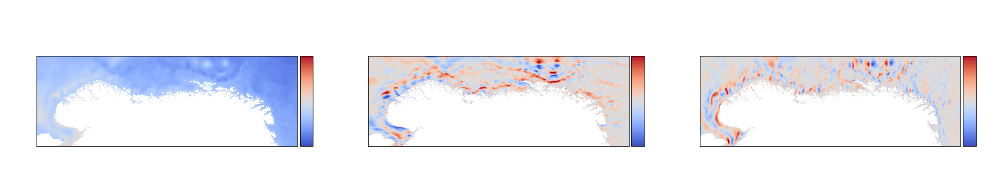

In [8]:
fig = plt.figure(figsize=(24,4))
plotSolution(fig, np.ma.average(upper_eta, axis=0), np.ma.average(upper_hu, axis=0), np.ma.average(upper_hv, axis=0), 1.0, 800.0, 800.0, avg_z_nc["time"][:], "Averaged upper layer currents", uv_min=-10, uv_max=10)

In [9]:
full_hu = np.ma.zeros((24,Y,X))
full_hv = np.ma.zeros((24,Y,X))
for t_idx in range(24):
    full_hu[t_idx] = z_nc["ubar"][t_idx]
    full_hv[t_idx] = z_nc["vbar"][t_idx]
    

In [10]:
upper_u = upper_hu / (25.0 + z_nc["zeta"][:])
upper_v = upper_hv / (25.0 + z_nc["zeta"][:])


In [11]:
full_u = full_hu / (np.ma.array(z_nc["h"][:], mask=full_hu[0].mask) + z_nc["zeta"][:])
full_v = full_hv / (np.ma.array(z_nc["h"][:], mask=full_hv[0].mask) + z_nc["zeta"][:])

In [12]:
baroclinic_hu = 25.0 *(upper_u - full_u)
baroclinic_hv = 25.0 *(upper_v - full_v)
baroclinic_eta = np.ma.array(np.zeros_like(baroclinic_hu), mask=baroclinic_hu.mask)

In [21]:
def arrayAnim(eta, hu, hv, t):
    fig = plt.figure(figsize=(24,4))

    ax, sp = plotSolution(fig, 
                              eta[0],
                              hu[0],
                              hv[0],
                              1.0,
                              800, 800, 
                              t[0], "Current baroclinic intial", uv_min=-10, uv_max=10)

    def animate(i):
        t_now = t[i] 
        plotSolution(fig, 
                        eta[i], 
                        hu[i], 
                        hv[i], 
                        1.0, 
                        800, 800, 
                        t_now, "Current baroclinic intial", uv_min=-10, uv_max=10,
                        ax=ax, sp=sp)

        clear_output(wait = True)

    #Matplotlib for creating an animation
    anim = animation.FuncAnimation(fig, animate, range(24), interval=250)
    plt.close(fig)
    return anim 


In [22]:
anim = arrayAnim(baroclinic_eta, baroclinic_hu, baroclinic_hv, z_nc["time"][:])
anim

The results of day-averages and baroclinic construction are far different